<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW5_boosting_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## **Домашняя работа 5: Бустинг и кластеризация**

### **Постановка задачи:**

В этой работы ваша задача подразделена на части:

*   В первой части вам предстоит реалищовать класс бустинга и сравнить его со встроенными классами популярных библиотек;
*   Во второй части вам предстоит применить алгоритмы кластеризации в задаче  разделения изображения на семантические компоненты;

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 13 февраля 23:59**

**Интересной вам работы!**

## **Часть 1: построение класса алгоритма бустинга**

**Количество баллов:** 7

Начнём с нужных библиотек и загрузки данных. Работать будем с датасетом из Kaggle и с синтетическим датасетом.

Данные c Kaggle связаны с телефонной рекламой португальского банковского учреждения. Цель классификации — спрогнозировать, подпишется ли клиент на срочный депозит (переменная y).

Всего в данных 20 признаков, ознакомиться с признаковым описанием можно [здесь](https://www.kaggle.com/code/sachinrajput17/subscription-prediction-for-bank-marketing-data).

Будем действовать из предположений, что датасет достаточно хорош, чтобы мы уже могли построить на нём базовую модель.

In [1]:
import time
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

from skimage import io, color, transform
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, f1_score, log_loss, roc_auc_score, make_scorer, silhouette_score, adjusted_mutual_info_score
from sklearn.model_selection import train_test_split, GridSearchCV, ParameterGrid
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.cluster import KMeans, spectral_clustering, AgglomerativeClustering
from sklearn.feature_extraction import image
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

In [2]:
!wget  -O 'data/bank_data.csv' -q 'https://www.dropbox.com/s/uy27mctxo0gbuof/bank_data.csv?dl=0'

In [3]:
df = pd.read_csv('data/bank_data.csv')
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1485,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,-1
416,43,services,divorced,high.school,unknown,no,no,cellular,apr,thu,...,1,999,0,nonexistent,-1.8,93.075,-47.1,1.483,5099.1,-1
6996,46,technician,single,university.degree,no,no,no,cellular,aug,thu,...,2,999,0,nonexistent,1.4,93.444,-36.1,4.968,5228.1,-1
5819,37,admin.,married,university.degree,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1
6183,57,retired,married,professional.course,no,yes,no,cellular,aug,fri,...,3,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,-1


Разделим на train и test (random_state не меняем)

In [4]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

Генерируем синтетические данные (seed не меняем)

In [5]:
np.random.seed(42)

num_obs = 10 ** 5
num_thresholds = 50

X_synthetic = np.random.normal(scale=3, size=[num_obs, 2])
x1_thresholds = np.random.choice(X_synthetic[:, 0], num_thresholds, False)
x2_thresholds = np.random.choice(X_synthetic[:, 1], num_thresholds, False)

gains = np.random.uniform(-0.4086, 0.5, size=[2 * num_thresholds, 1])
x1_thresholds_cond = [X_synthetic[:, 0] >= threshold for threshold in x1_thresholds]
x2_thresholds_cond = [X_synthetic[:, 1] >= threshold for threshold in x2_thresholds]

noise = np.random.uniform(-0.5, 0.5, size=num_obs)

y_synthetic_probits = np.sum(
    gains[:num_thresholds] * x1_thresholds_cond + gains[num_thresholds:] * x2_thresholds_cond, axis=0
) + noise
y_synthetic = np.sign(y_synthetic_probits)

X_train_synthetic, y_train_synthetic = X_synthetic[:int(num_obs * 0.8)], y_synthetic[:int(num_obs * 0.8)]
X_test_synthetic, y_test_synthetic = X_synthetic[int(num_obs * 0.8):], y_synthetic[int(num_obs * 0.8):]

px.histogram(x = y_synthetic_probits, nbins=100)

Некоторый полезный код для визуализации предсказаний (пригодится позже)

In [50]:
import matplotlib.pyplot as plt

def plot_predicts(model, features, targets, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='', mode='classification'):
    '''
    Функция для визуализации предсказаний модели на двухмерной плоскости
    param model: обученная модель классификации или регрессии для двухмерных объектов
    param features: признаки выборки (a.k.a. X)
    param targets: целевая переменная выборки (a.k.a y)
    param x_lim: пределы для x
    param y_lim: пределы для y
    param examples_density: доля выборки, которая будет нарисована
    param steps: частота разбиения плоскости
    param num_ticks: число подписей на графике
    param title: заголовок графика
    param mode: режим 'classification' - вероятности положительного класса
                режим 'regression' - вещественная целевая переменная
    '''
    mask = np.random.choice([True, False], size=features.shape[0],
                            p=[examples_density, 1.0 - examples_density])

    features_x = (features[mask, 0] - x_lim[0]) / (x_lim[1] - x_lim[0]) * steps
    features_y = (features[mask, 1] - y_lim[0]) / (y_lim[1] - y_lim[0]) * steps

    xs = np.linspace(x_lim[0], x_lim[1], steps)
    ys = np.linspace(y_lim[0], y_lim[1], steps)


    xs, ys = np.meshgrid(xs, ys)
    grid = np.stack([xs.flatten(), ys.flatten()], axis=1)

    if mode == 'classification':
        if isinstance(model, Boosting):
            predicts = model.predict_proba(grid).reshape(steps, steps)
        else:
            predicts = model.predict_proba(grid)[:, 1].reshape(steps, steps)
        values = (targets[mask] == 1).astype(np.float64)
    elif mode == 'regression':
        predicts = model.predict(grid).reshape(steps, steps)
        values = targets[mask]
    else:
        raise ValueError('Unknown mode')

    plt.figure(figsize=(10, 10))
    plt.imshow(predicts, origin='lower')
    plt.scatter(features_x, features_y, c=values, edgecolors='white', linewidths=1.5)
    plt.colorbar()

    plt.xticks(np.linspace(0, steps, num_ticks), np.linspace(x_lim[0], x_lim[1], num_ticks))
    plt.yticks(np.linspace(0, steps, num_ticks), np.linspace(y_lim[0], y_lim[1], num_ticks))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.grid()
    plt.show()

### **Задание 1. (4 балла) Реализуйте бустинг для задачи бинарной классификации**

Реализовывать класс буситнга необходимо согласно его теоретическому описанию. Вы начинаете с параметрами:

- `base_model_class=DecisionTreeRegressor` — базовая модель
- `base_model_params: dict={'max_features': 0.1}` — параметрмы базовой модели, рассчет максимального количества признаков полагаем как: `max(1, int(max_features * n_features_in_))`
- `n_estimators: int=10` — количество моделей
- `learning_rate: float=0.1` — скорость обучения
- `subsample: float=0.3` — доля данных, которая будет использоваться для подбора отдельных алгоритмов.
- `random_seed: int=228` — тут как всегда
- `custom_loss: list or tuple=None` — функция потерь
- `use_best_model: bool=False` — использовать ли при вызове predict и predict_proba лучшее с точки зрения валидационной выборки число деревьев в композиции
- `n_iter_early_stopping: int=None` — ранний критерий остановки

**Примечание:**

Поскольку градиентный бустинг обучается через последовательное создание моделей, может получиться так, что оптимальная с точки зрения генерализации модель будет получена на промежуточной итерации. Обычно для контроля такого поведения в методе `fit` передается также валидационная выборка, по которой можно оценивать общее качество модели в процессе обучения (желательно делать это каждую итерацию, но если ваша имплементация слишком медленная или ваше железо не тянет, можно делать это реже).

**Примечание 2:**

Нет смысла обучать действительно глубокую модель на 1000 деревьев и больше, если оптимальный ансамбль получился, к примеру, на 70 итерации и в течение какого-то количества итераций не улучшился - поэтому мы также задействуем early stopping при отсутствии улучшений в течение некоторого числа итераций.

In [7]:
from collections import Counter
import datetime

class Boosting:

    def __init__(
        self,
        base_model_class=DecisionTreeRegressor,
        base_model_params: dict={'max_features': 0.1},
        n_estimators: int=10,
        learning_rate: float=0.1,
        subsample: float=0.3,
        random_seed: int=228,
        custom_loss: list or tuple=None,
        use_best_model: bool=False,
        n_iter_early_stopping: int=None
    ):

        # Класс базовой модели
        self.base_model_class = base_model_class
        # Параметры для инициализации базовой модели
        self.base_model_params = base_model_params
        # Число базовых моделей
        self.n_estimators = n_estimators
        # Длина шага (которая в лекциях обозначалась через eta)
        self.learning_rate = learning_rate
        # Доля объектов, на которых обучается каждая базовая модель
        self.subsample = subsample
        # seed для бутстрапа, если хотим воспроизводимость модели
        self.random_seed = random_seed
        # Использовать ли при вызове predict и predict_proba лучшее
        # с точки зрения валидационной выборки число деревьев в композиции
        self.use_best_model = use_best_model
        # число итераций, после которых при отсутствии улучшений на валидационной выборке обучение завершается
        self.n_iter_early_stopping = n_iter_early_stopping

        # Место для нулевой модели
        self.initial_model_pred = None

        # Список для хранения весов при моделях
        self.gammas = []

        # Создаем список базовых моделей
        self.models = [self.base_model_class(**self.base_model_params) for _ in range(self.n_estimators)]

        # Если используем свою функцию потерь, ее нужно передать как список из loss-a и его производной
        if custom_loss is not None:
            self.loss_fn, self.loss_derivative = custom_loss
        else:
            self.sigmoid = lambda z: 1 / (1 + np.exp(-z))
            self.loss_fn = lambda y, z: -np.log(self.sigmoid(y * z)).mean()
            self.loss_derivative = lambda y, z: -y * self.sigmoid(-y * z)

        self.old_predictions = None


    def _fit_new_model(self, X: np.ndarray, y: np.ndarray or list, n_model: int):
        """
        Функция для обучения одной базовой модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :param n_model: номер модели, которую хотим обучить
        """
        # здесь не использую для всех бутстрап-семплов один и тот-же random_state, чтобы базовые модели обучались на разных данных обучающей выборки, а не только 30% (subsample значении)
        n_samples = int(len(X) * self.subsample)
        X_train = pd.DataFrame(X).sample(n_samples, random_state=self.random_seed+n_model)
        y_train = pd.DataFrame(y).sample(n_samples, random_state=self.random_seed+n_model)
        self.models[n_model].fit(X_train, y_train)
        
        new_predictions = self.learning_rate * self.models[n_model].predict(X)
        return new_predictions.flatten()

    def _fit_initial_model(self, X: np.ndarray, y: np.ndarray or list) -> np.ndarray:
        """
        Функция для построения нулевой (простой) модели. Не забудьте взять логарифм, потому что сигмоида применяется
        уже к сумме предсказаний базовых моделей, а не к каждому предсказанию каждой модели по отдельности.
        Подойдёт константная модель, возвращающая самый популярный класс,
        но если хотите, можете сделать что-нибудь посложнее.
        Реализация самого популярного класса считается через класс Counter.
        """
        most_popular_class = Counter(y).most_common(1)[0][0]
        self.initial_model_pred = np.array([most_popular_class]*len(y), dtype=float)
        self.old_predictions = self.initial_model_pred
        return self.initial_model_pred

    def _find_optimal_gamma(self, y: np.ndarray or list, old_predictions: np.ndarray,
                            new_predictions: np.ndarray, boundaries: tuple or list=(0.01, 1)):
        """
        Функция для поиска оптимального значения параметра gamma (коэффициент перед новой базовой моделью).
        :param y: вектор целевой переменной
        :param old_predictions: вектор суммы предсказаний предыдущих моделей (до сигмоиды)
        :param new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
        :param boudnaries: в каком диапазоне искать оптимальное значение ɣ (array-like объект из левой и правой границ)
        """
        # Определеяем начальные лосс и оптимальную гамму
        loss, optimal_gamma = self.loss_fn(y, old_predictions), 0
        # Множество, на котором будем искать оптимальное значение гаммы
        gammas = np.linspace(*boundaries, 100)
        # Простым перебором ищем оптимальное значение
        for gamma in gammas:
            predictions = old_predictions + gamma * new_predictions
            gamma_loss = self.loss_fn(y, predictions)
            if gamma_loss < loss:
                optimal_gamma = gamma
                loss = gamma_loss

        return optimal_gamma


    def fit(self, X: np.ndarray, y: np.ndarray or list, eval_set=None, verbose=False):
        """
        Функция для обучения всей модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :eval_set: кортеж (X_val, y_val) для контроля процесса обучения или None, если контроль не используется
        :verbose: bool для мониторинга обучения бустинга
        """
        self.verbose = verbose
        self._fit_initial_model(X, y)
        y = y - self.initial_model_pred

        best_loss = float('inf')
        best_iter = None
        
        for i in range(self.n_estimators):
            if self.verbose:
                print(f'{i} iteration: started at {datetime.datetime.now().strftime("%H:%M:%S")}, {self.n_estimators - i - 1} iters left')
            new_predictions = self._fit_new_model(X, y, n_model=i)  # предсказание базовой модели
            optimal_gamma = self._find_optimal_gamma(y, self.old_predictions, new_predictions)
            self.gammas.append(optimal_gamma)
            self.old_predictions += self.learning_rate * optimal_gamma * new_predictions
            y = -1 * self.loss_derivative(y, self.old_predictions)
            
            if self.n_iter_early_stopping is not None:
                if eval_set is not None:
                    X_val, y_val = eval_set
                else:
                    X_val, y_val = X, y
                current_loss = self.loss_fn(y_val, self.predict(X_val))
                if verbose:
                    print(f'{i} iteration validation loss = {current_loss}')

                if current_loss < best_loss:
                    best_loss, best_iter = current_loss, i
                elif i == best_iter + self.n_iter_early_stopping:
                    if verbose:
                        print(f'Fitting stoppend at {i} iteration, loss wasnt decreasing last {self.n_iter_early_stopping} iterations') 
                    break
        if self.use_best_model:
            self.models = self.models[:best_iter+1]
            self.gammas = self.gammas[:best_iter+1]

            
    def predict(self, X: np.ndarray):
        """
        Функция для предсказания классов обученной моделью бустинга
        :param X: матрица признаков
        """
        return np.round(self.predict_proba(X) > 0.5)

    def predict_proba(self, X: np.ndarray):
        """
        Функция для предсказания вероятностей классов обученной моделью бустинга
        :param X: матрица признаков
        """
        final_pred = np.full(len(X), self.initial_model_pred[0], dtype=float)
        for i in range(len(self.gammas)):
            final_pred += self.gammas[i] * self.learning_rate * np.array(self.models[i].predict(X)).flatten()
        return final_pred

    @property
    def feature_importances_(self):
        """
        Функция для вычисления важностей признаков.
        Вычисление должно проводиться после обучения модели
        и быть доступно атрибутом класса.

        Здесь (так как не указано какой метод использовать) я усредняю feature importance по всем деревьям с учетом весов моделей
        """
        fi = np.array([0.0] * self.models[0].feature_importances_)
        for i in range(len(self.gammas)):
            fi += self.gammas[i] * self.models[i].feature_importances_
        fi /= sum(self.gammas)
        return fi
    
    def get_params(self, deep=False):
        return {
            "base_model_class": self.base_model_class,
            "base_model_params": self.base_model_params,
            "n_estimators": self.n_estimators,
            "learning_rate": self.learning_rate,
            "subsample": self.subsample,
            "random_seed": self.random_seed,
            "use_best_model": self.use_best_model,
            "n_iter_early_stopping": self.n_iter_early_stopping
        }    

    def set_params(self, **params):
        for key, value in params.items():
            setattr(self, key, value)
        return self

## **Тест для вашей имплементации.**

Если класс написан правильно, две следующие ячейки должна отработать без ошибок и относительно быстро (у автора задания 2 и 0.2 секунд соответственно, accuracy 0.911 и 0.879 соответственно). Если у вас получилось качество выше указанного — отлично!

In [765]:
%%time

boosting = Boosting()
boosting.fit(X_train_synthetic, y_train_synthetic)
preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)
print(accuracy_score((y_test_synthetic == 1), preds))

0.90905
CPU times: user 917 ms, sys: 3.08 ms, total: 921 ms
Wall time: 926 ms


In [762]:
%%time

boosting = Boosting()
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))
print(accuracy_score((df_test.y.values == 1), np.round(preds)) > 0.87)

0.8755387931034483
True
CPU times: user 95.5 ms, sys: 1.91 ms, total: 97.4 ms
Wall time: 96.2 ms


### **Задание 2. (1.2 балла) Сравнение с базовыми моделями**

- Сравните результаты вашей имплементации бустинга с указанными ниже базовыми моделями на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных. Данные берите из реальной задачи.
- Ответьте на поставленные вопросы

Варианты для базовой модели (разумеется, не надо их программировать самостоятельно, берите нужные классы из sklearn):

- Решающее дерево глубины 6
- Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)
- Линейная регрессия

### Реальные данные

In [8]:
# GB over DecisionTree(max_depth=6)
boosting_dt = Boosting(base_model_class=DecisionTreeRegressor, base_model_params={'max_depth': 6})
boosting_dt.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = boosting_dt.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8890086206896551


In [9]:
# Decision Tree (max_depth=6)
dt = DecisionTreeClassifier(max_depth=6,random_state=228)
dt.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = dt.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8836206896551724


In [10]:
# GB over RandomForest
boosting_rf = Boosting(base_model_class=RandomForestRegressor, base_model_params={'n_estimators': 500})
boosting_rf.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = boosting_rf.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8938577586206896


In [740]:
# Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=228)
rf.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = rf.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.9014008620689655


In [11]:
# GB over LinReg
lr = Boosting(base_model_class=LinearRegression, base_model_params={})
lr.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = lr.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8292025862068966


In [56]:
# LogReg
lr = LogisticRegression()
lr.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = lr.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8485991379310345


### Синтетические данные

0.91415


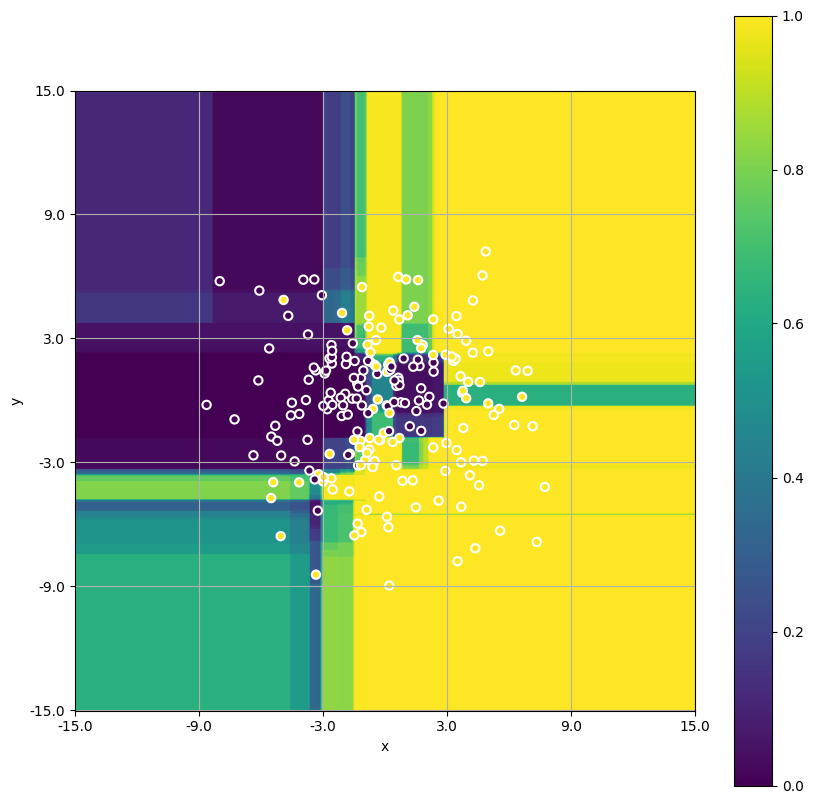

In [44]:
# GB over DecisionTree(max_depth=6)
boosting_dt = Boosting(base_model_class=DecisionTreeRegressor, base_model_params={'max_depth': 6})
boosting_dt.fit(X_train_synthetic, y_train_synthetic)
preds = np.round(boosting_dt.predict_proba(X_test_synthetic) > 0.5)
print(accuracy_score((y_test_synthetic == 1), preds))

plot_predicts(boosting_dt, X_test_synthetic, y_test_synthetic)

0.90255


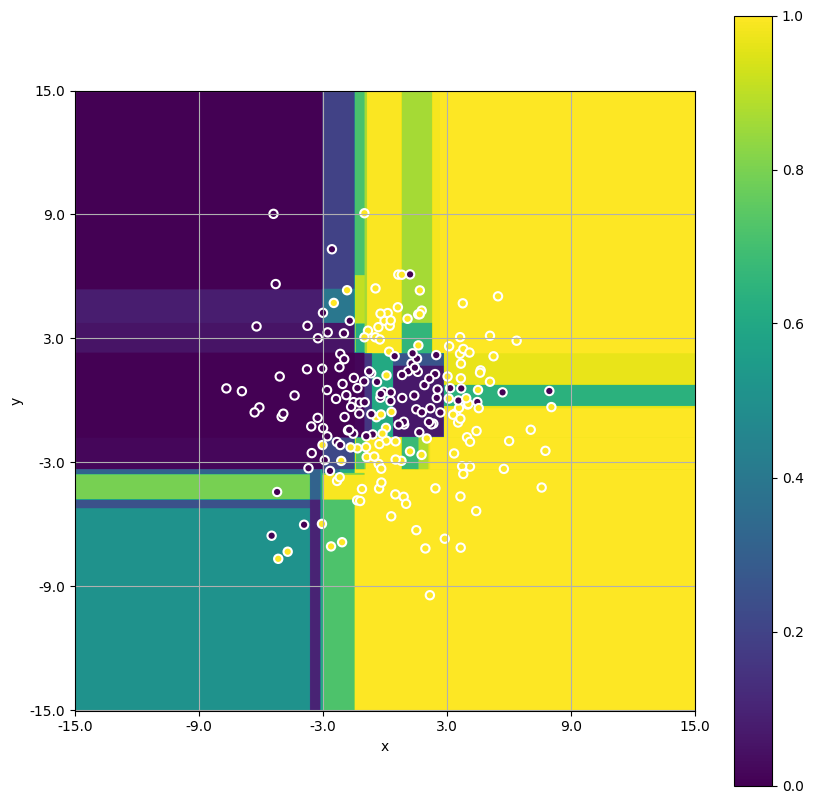

In [51]:
# Decision Tree (max_depth=6)
dt = DecisionTreeClassifier(max_depth=6,random_state=228)
dt.fit(X_train_synthetic, y_train_synthetic)
preds = dt.predict(X_test_synthetic)
print(accuracy_score(y_test_synthetic, preds))

plot_predicts(dt, X_test_synthetic, y_test_synthetic)

0.9183


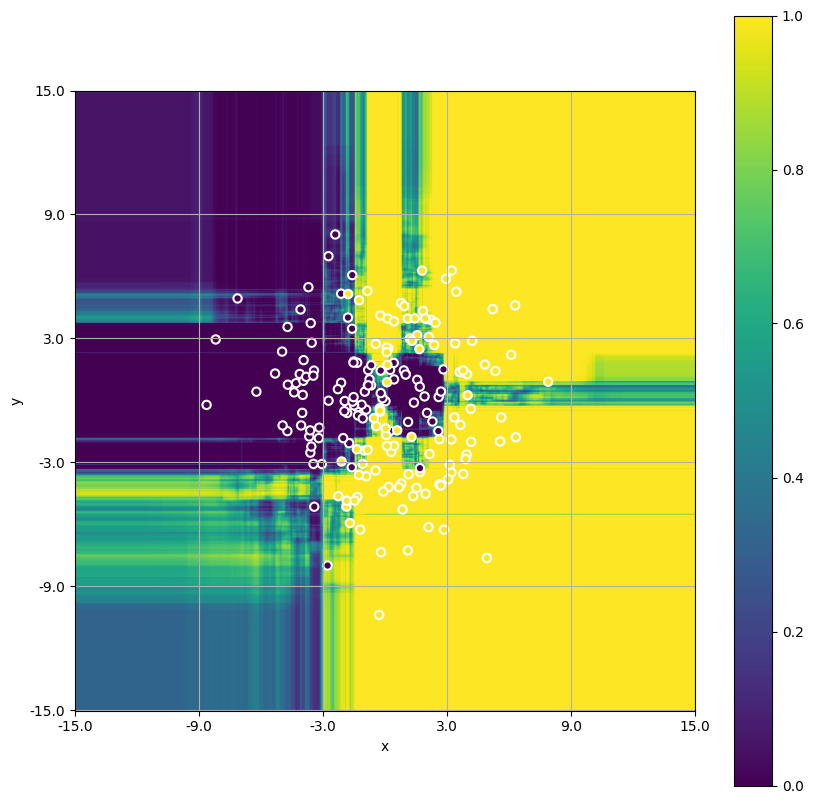

In [46]:
# GB over RandomForest
boosting_rf = Boosting(base_model_class=RandomForestRegressor, base_model_params={'n_estimators': 200})
boosting_rf.fit(X_train_synthetic, y_train_synthetic)
preds = np.round(boosting_rf.predict_proba(X_test_synthetic) > 0.5)
print(accuracy_score((y_test_synthetic == 1), preds))

plot_predicts(boosting_rf, X_test_synthetic, y_test_synthetic)

0.9118


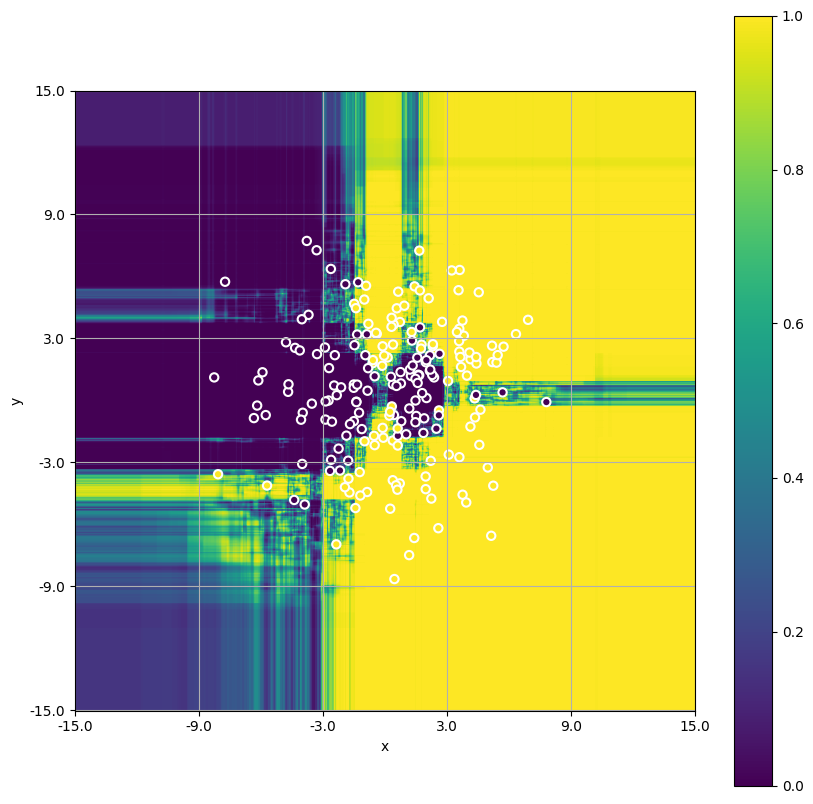

In [52]:
# Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=228)
rf.fit(X_train_synthetic, y_train_synthetic)
preds = rf.predict(X_test_synthetic)
print(accuracy_score(y_test_synthetic, preds))

plot_predicts(rf, X_test_synthetic, y_test_synthetic)

0.7078


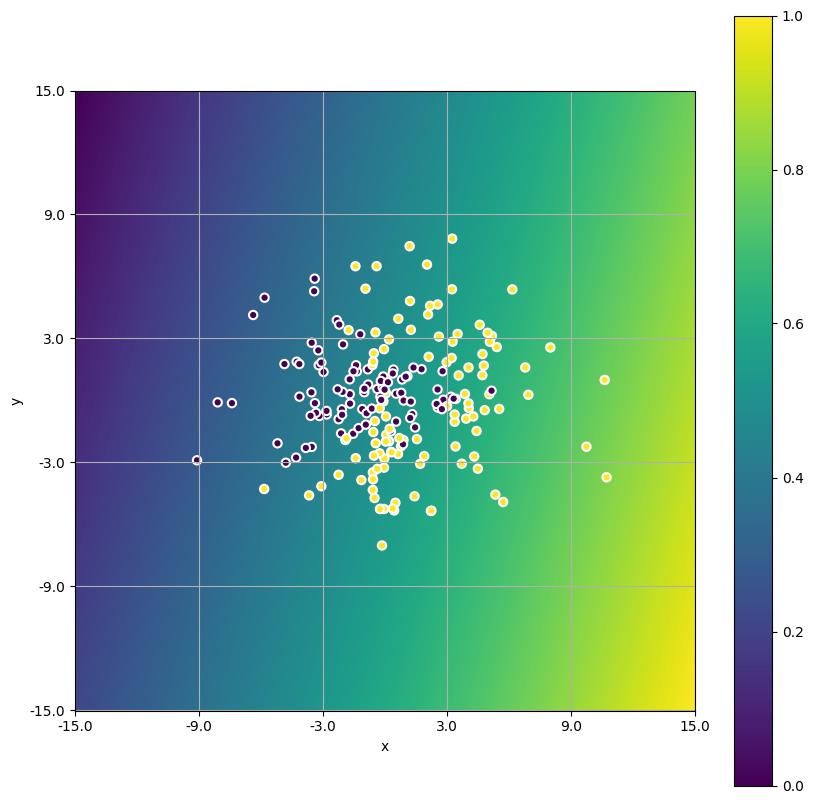

In [48]:
# GB over LinReg
boosting_lr = Boosting(base_model_class=LinearRegression, base_model_params={})
boosting_lr.fit(X_train_synthetic, y_train_synthetic)
preds = np.round(boosting_lr.predict_proba(X_test_synthetic) > 0.5)
print(accuracy_score((y_test_synthetic == 1), preds))

plot_predicts(boosting_lr, X_test_synthetic, y_test_synthetic)

0.68905


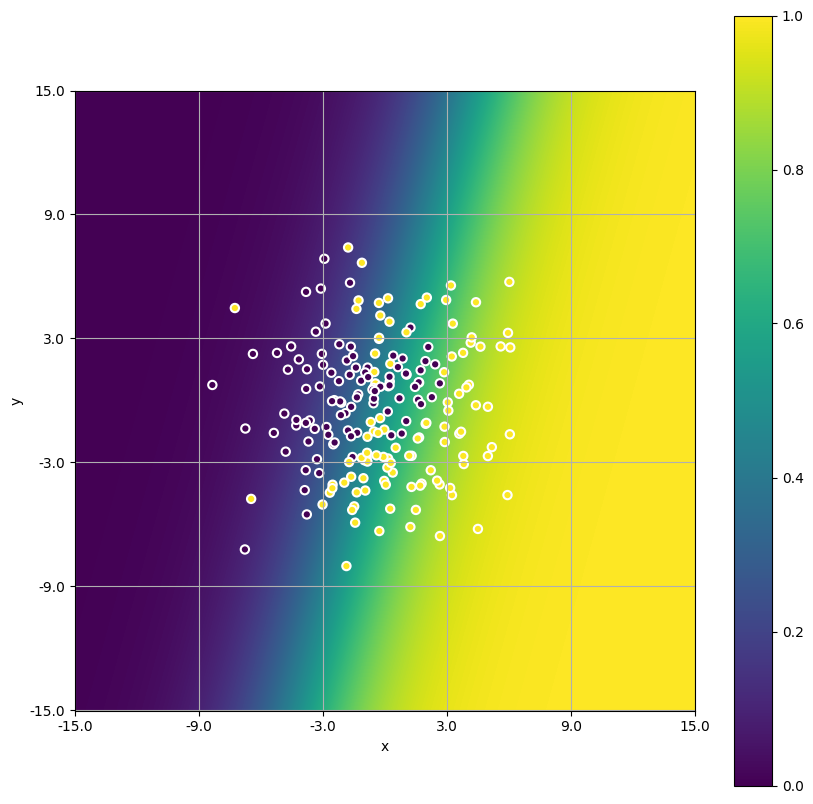

In [53]:
# LogReg
lr = LogisticRegression()
lr.fit(X_train_synthetic, y_train_synthetic)
preds = lr.predict(X_test_synthetic)
print(accuracy_score(y_test_synthetic, preds))

plot_predicts(lr, X_test_synthetic, y_test_synthetic)

**Вопросы:**

1) Какая из моделей имеет оптимальное качество? С чем это связано?

2) Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

3) Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

4) Визуализируйте предсказания моделей на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.

```
1. Лучшее качество показали модели: случайный лес и градиентный бустинг с базовой моделью-случайным лесом. Это связано с особенностями данных моделей: случайный лес позволяет сильно снизить разброс, а градиентный бустинг позволяет снизить смещение, в итоге получаем "идеальную" модель.

2. Сильнее всего переобучаются линейные модели. 

3. Бустинг над линейной регрессией показывает схожий результат с лог регрессий: линейная регрессия без регуляризации переобучается, она не способна улавливать нелинейные зависимости, в результате последующие модели не сильно улучшают модель.

4. На предсказаниях бустингов и случайного леса можно визуально увидеть выделенные кластеры, в то время как на линейных моделях этого не видно. Так же по графикам можно увидеть явное переобучение моделей, особенно случайного леса.
```

### **Задание 3. (0.8 балла) Сравнение с бустингами**

- Сравните на реальных данных данных любую из трёх популярных имплементаций градиентного бустинга (xgboost, lightgbm, catboost) с вашей реализацией.
- Укажите, получилось ли у вас победить библиотечные реализации на тестовых данных?

**Примечание:**

Подберите основные гиперпараметры (число деревьев, длина шага, глубина дерева/число листьев) для обоих методов.


In [58]:
from catboost import CatBoostClassifier

cat = CatBoostClassifier(verbose=False)
cat.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = cat.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values)
print(accuracy_score(df_test.y.values, preds))

0.8960129310344828


In [756]:
boosting_dt = Boosting()
boosting_dt.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
preds = boosting_dt.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8766163793103449


`Из коробки CatBoost показывает лучшее значение accuracy. Подберем гиперпараметры для каждой модели.`

In [97]:
boosting_params = {
    'learning_rate': [0.001, 0.01, 0.1],
    'n_estimators': [None, 100, 200],
    'early_stopping_rounds': [None, 5, 10],
    'max_depth': [None, 6, 12]
}

setka = GridSearchCV(CatBoostClassifier(logging_level='Silent'), boosting_params, cv=4, scoring=make_scorer(accuracy_score), verbose=3, n_jobs=-1)
setka.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
setka.best_estimator_, setka.best_score_

Fitting 4 folds for each of 81 candidates, totalling 324 fits
[CV 3/4] END early_stopping_rounds=None, learning_rate=0.001, max_depth=None, n_estimators=100;, score=0.862 total time=   0.3s
[CV 4/4] END early_stopping_rounds=None, learning_rate=0.001, max_depth=None, n_estimators=100;, score=0.866 total time=   0.3s
[CV 1/4] END early_stopping_rounds=None, learning_rate=0.001, max_depth=None, n_estimators=100;, score=0.872 total time=   0.3s
[CV 2/4] END early_stopping_rounds=None, learning_rate=0.001, max_depth=None, n_estimators=100;, score=0.850 total time=   0.3s
[CV 2/4] END early_stopping_rounds=None, learning_rate=0.001, max_depth=None, n_estimators=200;, score=0.851 total time=   0.6s
[CV 1/4] END early_stopping_rounds=None, learning_rate=0.001, max_depth=None, n_estimators=200;, score=0.874 total time=   0.6s
[CV 3/4] END early_stopping_rounds=None, learning_rate=0.001, max_depth=None, n_estimators=200;, score=0.868 total time=   0.6s
[CV 4/4] END early_stopping_rounds=None, l

(<catboost.core.CatBoostClassifier at 0x38443d8a0>, 0.8938577586206896)

In [98]:
setka.best_estimator_.get_params()

{'logging_level': 'Silent',
 'early_stopping_rounds': None,
 'learning_rate': 0.1,
 'max_depth': None,
 'n_estimators': 200}

In [102]:
boosting_params = {
    'learning_rate': [0.001, 0.01, 0.1],
    'n_estimators': [None, 10, 100, 200],
    'early_stopping_rounds': [None, 5, 10],
    'base_model_params': [{'max_depth': None}, {'max_depth': 6}, {'max_depth': 12}]
        
}

setka_my = GridSearchCV(Boosting(), boosting_params, cv=4, scoring=make_scorer(accuracy_score), verbose=False, n_jobs=-1)
setka_my.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
setka_my.best_estimator_, setka_my.best_score_

(<__main__.Boosting at 0x38440dd80>, 0.37351831896551724)

In [103]:
setka_my.best_estimator_.get_params()

{'base_model_class': sklearn.tree._classes.DecisionTreeRegressor,
 'base_model_params': {'max_depth': None},
 'n_estimators': 10,
 'learning_rate': 0.001,
 'subsample': 0.3,
 'random_seed': 228,
 'use_best_model': False,
 'n_iter_early_stopping': None}

`На кросс-валидации самописный бустинг показывает крайне плохой результат по сравнению с CatBoost. Не зря CatBoost считается одной из лучших реализаций бустинга.`

### **Задание 4. (1 балл) Капля теории**

Теоретически, мы могли бы построить бэггинг на логистических регрессиях. Оцените целесообразность такого подхода. В ответе укажите:

- Идею бэггинга и его свойства;
- Характеристики модели логистической регресии;
- Сопоставление и вывод.


```
Бэггинг - это вариант ансамблирования моделей, основанный на обучении N независимых моделей на подвыборках из обучающих данных и объединении их предсказаний в итоговое предсказание либо выбором наиболее часто встречающего класс (для задач классификации), либео через усреднение всех результатов (для задач регрессии).

Основные свойства: смещение (bias) у бэггинга равно смещению одной базовой модели, а в разброс (variance) сильно ниже, чем у одной базовой модели (если базовые алгоритмы некоррелированы = более разные веса, разная структура базовых алгоритмов и тд). 

Лог регрессия - линейная модель используемая в задачах бинарной классификации. Основным недостаткой является ее линейность: логрег предполагает линейную зависимость между независимыми переменными, нелинейную связь она не сможет уловить. Кроме того модель слишком чувствительна к выбросам.

Теоретически можно использовать бэггинг на логистических регрессиях, НО:

1. Для наилучшего снижения разброса бэггингом базовые модели должны быть некоррелированы, логистическая регрессия же применяет сигмоиду для предсказания, что означает, что даже бутстрапирование здесь не поможет.

2. Снижение ошибки за счет поиска нелинейности в данных невозможно в виду определения логистической регрессии.

3. Как следствие, не очень целесообразно использовать лог регрессию как базовую модель. Куда лучше будет качества с деревьями.
```

## **Часть 1: Разделение изображения на семантические компоненты**

**Количество баллов:** 3

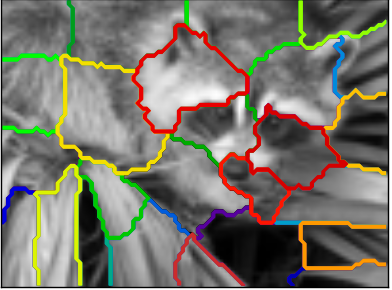

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации.

Проверим их на ```duck.jpg``` и ```owls.jpg```

### **Задание 5 (0.2 балла)**

Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

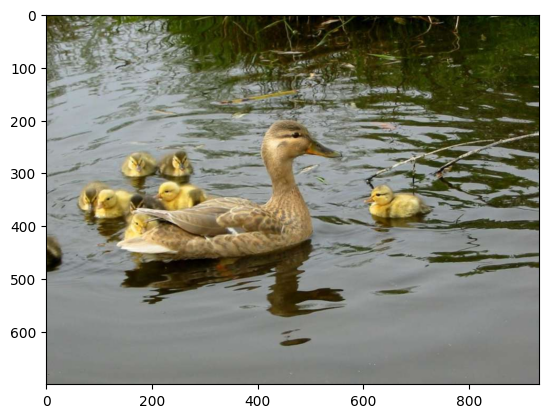

In [45]:
duck = Image.open("data/duck.jpg")
plt.imshow(duck)
plt.show()

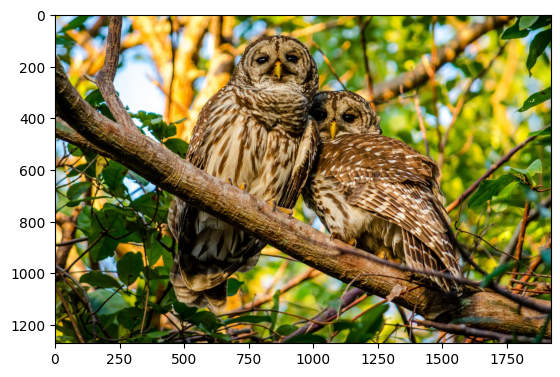

In [46]:
owls = Image.open("data/Owls.jpg")
plt.imshow(owls)
plt.show()

### **Задание 6 (0.8 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

- Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :))
- Проанализируйте результат

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [78]:
def find_components(image, lmbd, n_clusters):
    width, height = image.size
    pixel_values = np.array(image.getdata()).reshape((width, height, 3))
    result = []
    for x in range(1, len(pixel_values) + 1):
        for y in range(1, len(pixel_values[x-1]) + 1):
            r, g, b = pixel_values[x-1][y-1]
            result.append((lmbd*x, lmbd*y, r, g, b))
    data = pd.DataFrame(result, columns=['lx', 'ly', 'r', 'g', 'b'])
    clust = KMeans(n_clusters=n_clusters, random_state=228)
    clust.fit(data)
    return clust.labels_.reshape((image.size[1], image.size[0]))

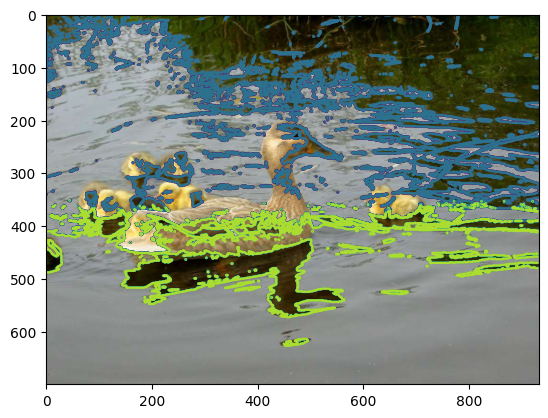

In [1184]:
labels = find_components(image=duck, lmbd=0.3, n_clusters=3)
plt.imshow(duck)
plt.contour(labels)
plt.show()

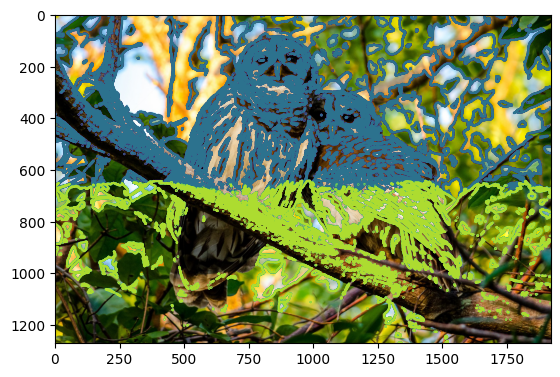

In [1186]:
labels = find_components(image=owls, lmbd=0.2, n_clusters=3)
plt.imshow(owls)
plt.contour(labels)
plt.show()

`При подборе гиперпараметров (n_clusters и lmbd) компоненты изменяются, но визуализация их оставляет желать лучшего... Значения lmbd=1.5 превращает картинку просто в полотно сплошных цветов.`

### **Задание 7 (0.8 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [117]:
def spectral_segmentation(img, n_clusters=3, beta=5, eps=1e-6):
    gray_img = color.rgb2gray(img)
    small_gray_img = transform.rescale(gray_img, 0.25)

    graph = image.img_to_graph(small_gray_img)
    graph.data = np.exp(-beta * graph.data / small_gray_img.std()) + eps
    labels = spectral_clustering(graph, n_clusters=n_clusters, assign_labels='kmeans', random_state=42)
    labels = labels.reshape(small_gray_img.shape)
    return small_gray_img, labels

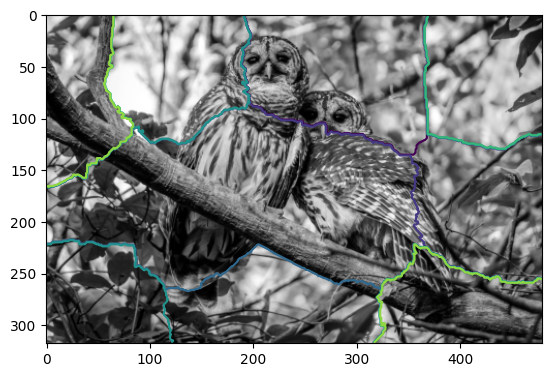

In [54]:
small_gray_img, labels = spectral_segmentation(owls, n_clusters=10)
plt.imshow(small_gray_img, cmap=plt.cm.gray)
plt.contour(labels)
plt.show()

`В данном алгоритме визуализация выглядит приятнее и логичнее. Для ускорения алгоритма исходные изображения привел к серому цвету и сжал в 4 раза (при сжатии только в 2 раза код выполняется слишком долго).`

### **Задание 8 (0.2 балла)**
- Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.
- Проанализируйте сравнение

`Выведу на одном полотне исходные изображения, а после обе кластеризации с n_clusters равными 3, 10, 50`

3it [02:15, 45.22s/it]


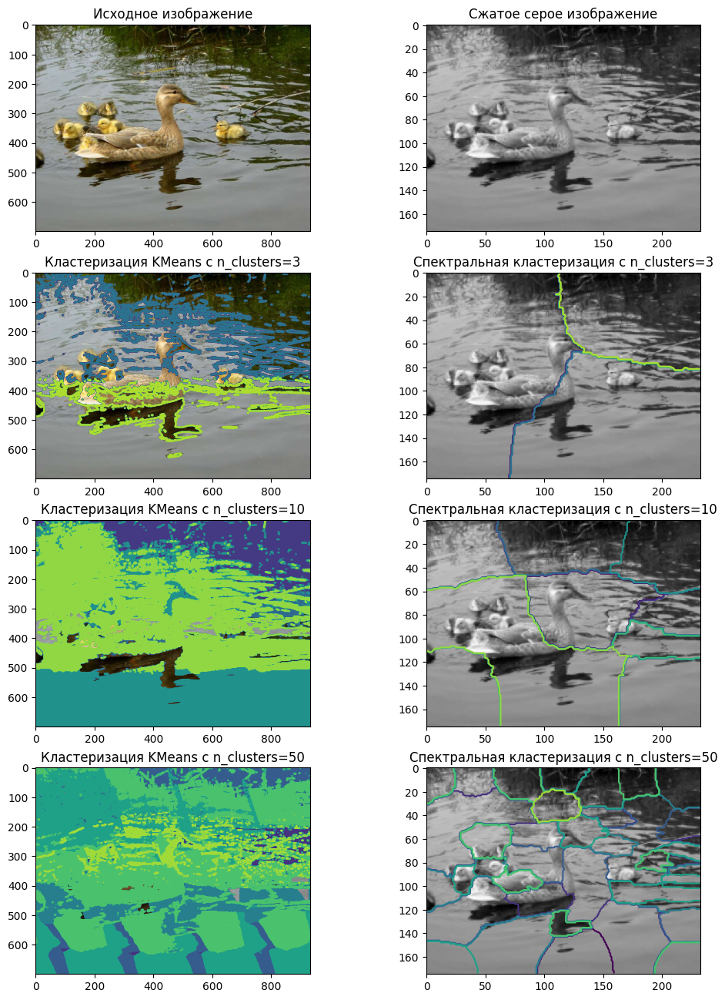

In [103]:
fig, axes = plt.subplots(4, 2, figsize=(12, 16))
axes[0, 0].imshow(duck)
axes[0, 0].set_title('Исходное изображение')

for i, n_clusters in tqdm(enumerate([3, 10, 50])):
    axes[i+1, 0].imshow(duck)
    axes[i+1, 0].contour(find_components(image=duck, lmbd=0.3, n_clusters=n_clusters))
    axes[i+1, 0].set_title(f'Кластеризация KMeans c n_clusters={n_clusters}')

    small_gray_img, labels = spectral_segmentation(duck, n_clusters=n_clusters)
    axes[i+1, 1].imshow(small_gray_img, cmap=plt.cm.gray)
    axes[i+1, 1].contour(labels)
    axes[i+1, 1].set_title(f'Спектральная кластеризация c n_clusters={n_clusters}')

axes[0, 1].imshow(small_gray_img, cmap=plt.cm.gray)
axes[0, 1].set_title('Сжатое серое изображение')

plt.show()

3it [28:28, 569.64s/it]


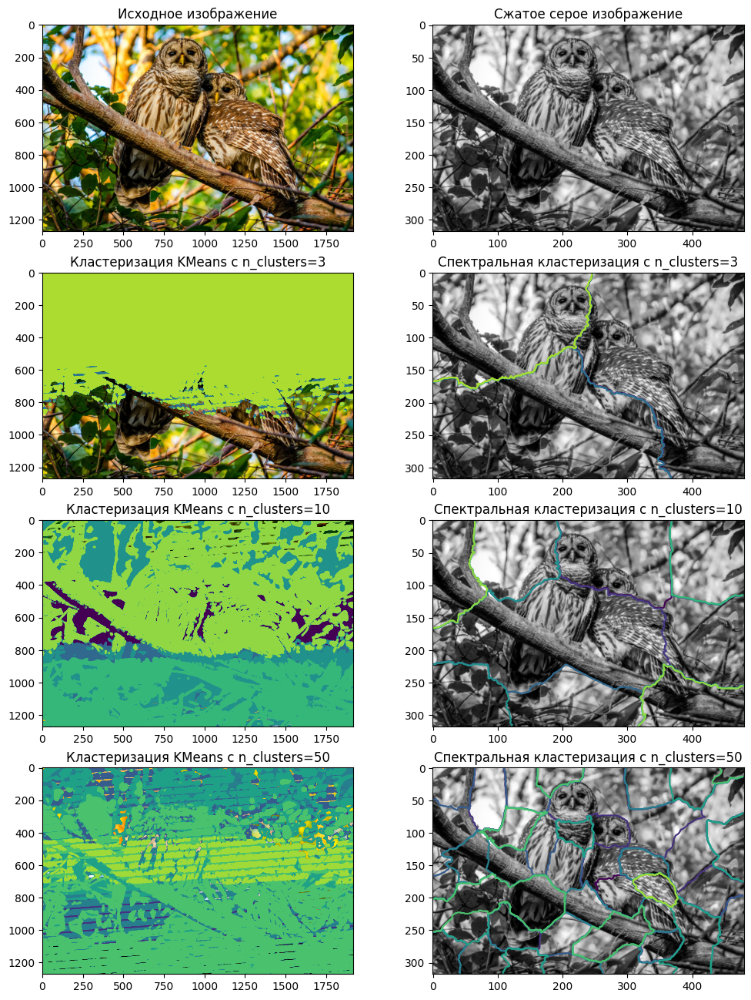

In [104]:
fig, axes = plt.subplots(4, 2, figsize=(12, 16))
axes[0, 0].imshow(owls)
axes[0, 0].set_title('Исходное изображение')

for i, n_clusters in tqdm(enumerate([3, 10, 50])):
    axes[i+1, 0].imshow(owls)
    axes[i+1, 0].contour(find_components(image=owls, lmbd=0.3, n_clusters=n_clusters))
    axes[i+1, 0].set_title(f'Кластеризация KMeans c n_clusters={n_clusters}')

    small_gray_img, labels = spectral_segmentation(owls, n_clusters=n_clusters)
    axes[i+1, 1].imshow(small_gray_img, cmap=plt.cm.gray)
    axes[i+1, 1].contour(labels)
    axes[i+1, 1].set_title(f'Спектральная кластеризация c n_clusters={n_clusters}')

axes[0, 1].imshow(small_gray_img, cmap=plt.cm.gray)
axes[0, 1].set_title('Сжатое серое изображение')

plt.show()

`Спектральная кластеризация показывает намного лучшее качество выделения сегментов, что видно даже визуально. НО это занимает куда больше ресурсов, даже при условии сжатия изображения в 4 раза.`

### **Задание 9 (1 балл)**

- Найдите интересную картинку милого животного и примените алгоритмы и к ней. Поэкспериментируйте с параметрами алгоритмов и постарайтесь добиться оптимального результата. Картинку нужно будет загрузить вместе с работой.

- Сравните два подхода и сегментации, к которым они приводят. Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

**Примечание:**

Слишком большие лучше не брать - считаться будет долго. Не забудьте визуализировать!


3it [01:08, 22.71s/it]


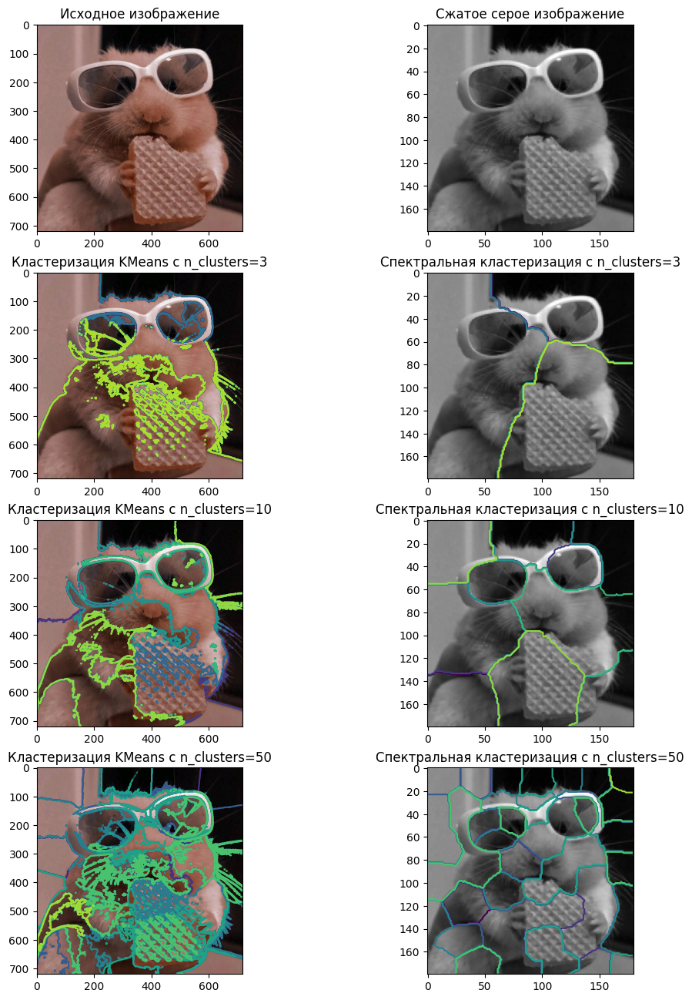

In [107]:
humster = Image.open("data/humster.jpg")

fig, axes = plt.subplots(4, 2, figsize=(12, 16))
axes[0, 0].imshow(humster)
axes[0, 0].set_title('Исходное изображение')

for i, n_clusters in tqdm(enumerate([3, 10, 50])):
    axes[i+1, 0].imshow(humster)
    axes[i+1, 0].contour(find_components(image=humster, lmbd=0.3, n_clusters=n_clusters))
    axes[i+1, 0].set_title(f'Кластеризация KMeans c n_clusters={n_clusters}')

    small_gray_img, labels = spectral_segmentation(humster, n_clusters=n_clusters)
    axes[i+1, 1].imshow(small_gray_img, cmap=plt.cm.gray)
    axes[i+1, 1].contour(labels)
    axes[i+1, 1].set_title(f'Спектральная кластеризация c n_clusters={n_clusters}')

axes[0, 1].imshow(small_gray_img, cmap=plt.cm.gray)
axes[0, 1].set_title('Сжатое серое изображение')

plt.show()

```
В данном случае (чисто визуально) KMeans неплохо справился с задачей: при n_clusters=10 алгоритм практически полноценно выделил отдельно вафлю как объект на картинке, очки на хомяке и самого хомяка. Для лучших результатов стоит перебрать random_state для лучшей инициализации и оптимальное количество кластеров n_clusters. 

Спектральная кластеризация в данном случае показала результат хуже, возможно стоит перебрать еще значения beta и eps. Попробуем сделать это.
```

12it [13:07, 65.59s/it] 


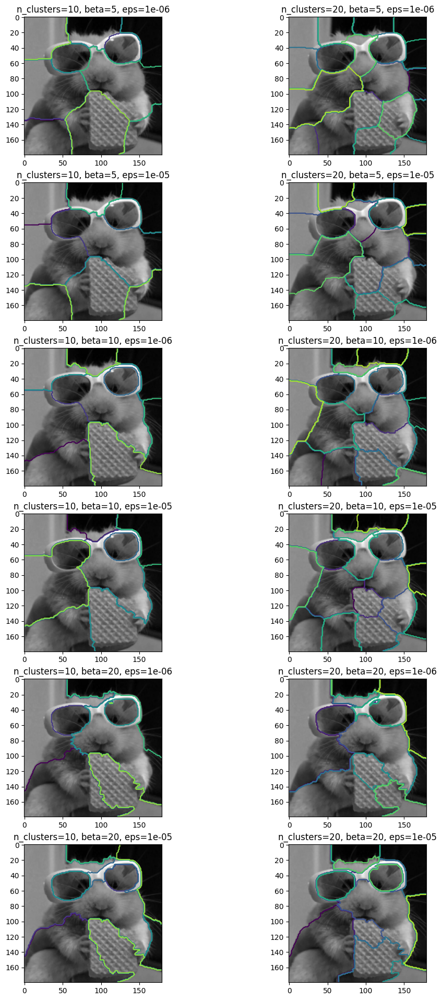

In [135]:
params = {
    'img': [humster],
    'n_clusters': [10, 20],
    'beta': [5, 10, 20],
    'eps': [1e-6, 1e-5]
}

fig, axes = plt.subplots(6, 2, figsize=(12, 24))
axes = axes.ravel()
setka = ParameterGrid(params)
for i, params in tqdm(enumerate(setka)):
    small_gray_img, labels = spectral_segmentation(**params)
    axes[i].imshow(small_gray_img, cmap=plt.cm.gray)
    axes[i].contour(labels)
    n_clusters, beta, eps = params['n_clusters'], params['beta'], params['eps']
    axes[i].set_title(f'{n_clusters=}, {beta=}, {eps=}')
plt.show()

`Видно, что чем больше значение beta, тем ближе сегментирование к фактическому разделению изображения на объекты.`

## **Бонус (1 балл)**

В качестве бонуса предлагаем вам построить алгоритм кластеризации типов движения на наборе Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

### **Задание 1 (0.05 балла)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [162]:
y_test = pd.read_table("data/samsung_har/samsung_test_labels.txt", header=None)
y_train = pd.read_table("data/samsung_har/samsung_train_labels.txt", header=None)

X_train = pd.read_csv("data/samsung_har/samsung_train.txt", header=None, sep=' ', skipinitialspace=True)
X_test = pd.read_table("data/samsung_har/samsung_test.txt", header=None, sep=' ', skipinitialspace=True)

X = pd.concat([X_train, X_test], axis=0)
y = pd.concat([y_train, y_test], axis=0)

In [163]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

array([1, 2, 3, 4, 5, 6])

In [164]:
X.head()

,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


### **Задание 2 (0.05 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [166]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### **Задание 3 (0.15 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мспользуем методы **понижения размерности**. В частности, мы будем использовать метод главных компонент. Если вы проходили степик, то знакомы с ним, если нет, то почитать про PCA вам нужно в [Конспекте](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture12-factorizations.pdf).

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма массива pca.explained_variance_ratio_ должна быть больше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

Требуется 65 компонент для объяснения 90% дисперсии


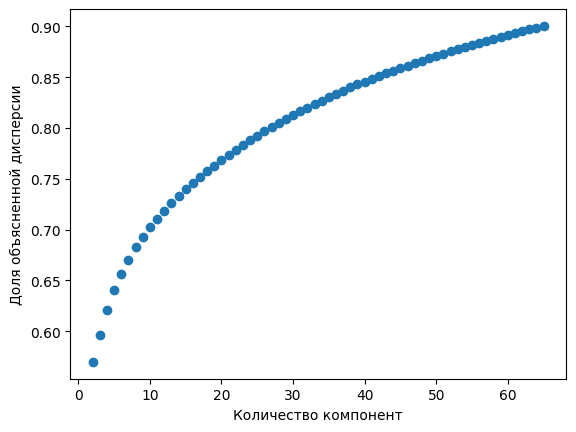

In [187]:

RANDOM_STATE = 42

explained_var = []
for n in range(2, 100):
    pca = PCA(n_components=n, random_state=RANDOM_STATE)
    pca.fit(X_scaled)
    explained_var_value = sum(pca.explained_variance_ratio_)
    explained_var.append(explained_var_value)
    if explained_var_value >= 0.9:
        print(f'Требуется {n} компонент для объяснения 90% дисперсии')
        break
    
plt.scatter(x=list(range(2, len(explained_var)+2)), y=explained_var)
plt.xlabel('Количество компонент')
plt.ylabel('Доля объясненной дисперсии')
plt.show()

### **Задание 4. (0.15 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [194]:
X_scaled_pca = pca.transform(X_scaled)
t1 = time.time()
kmeans = KMeans(n_clusters=6, n_init=100, random_state=RANDOM_STATE)
kmeans.fit(X_scaled_pca)
t2 = time.time()
print(f'Время обучения = {t2 - t1} секунд')

Время обучения = 7.695533990859985 секунд


### **Задание 6 (0.05 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

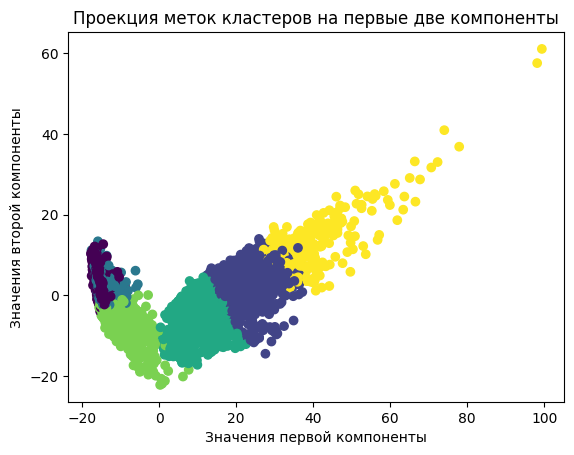

In [214]:
plt.scatter(x=X_scaled_pca[:, 0], y=X_scaled_pca[:, 1], c=kmeans.labels_)
plt.xlabel('Значения первой компоненты')
plt.ylabel('Значения второй компоненты')
plt.title('Проекция меток кластеров на первые две компоненты')
plt.show()

### **Задание 7 (0.1 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [216]:
silhouette_score(X=X_scaled_pca, labels=kmeans.labels_)

0.14149759467581455

In [228]:
adjusted_mutual_info_score(labels_true=y[0].to_list(), labels_pred=kmeans.labels_)

0.5597305782279441

```
В качестве внешней метрики я взял метрику Adjusted Mutual Information, так как у нас уже есть размеченные классы и мы можем сравнить метки нашей кластеризации с данными классами. В качестве внутренней метрики взял коэффициент Силуэта, как классическую метрику для измерения качества модели кластеризации.

Чем ближе коэффициент Силуэта к 1, тем лучше, в данном случае мы видим значение в 0.14, что говорит о потенциале улучшения модели.

AMI принимает значения от 0 до 1, чем больше - тем больше похожи размеченные классы и метки кластеризации. В нашем случае получили значение 0.56, что так же говорит, что есть еще куда расти.
```

### **Задание 8 (0.15 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [249]:
t1 = time.time()
aggl = AgglomerativeClustering(n_clusters=6)
aggl.fit(X_scaled_pca)
t2 = time.time()
print(f'Время обучения = {t2 - t1} секунд')

Время обучения = 1.64329195022583 секунд


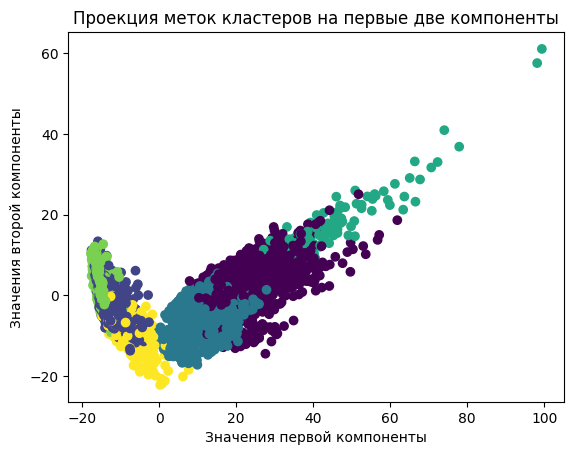

In [250]:
plt.scatter(x=X_scaled_pca[:, 0], y=X_scaled_pca[:, 1], c=aggl.labels_)
plt.xlabel('Значения первой компоненты')
plt.ylabel('Значения второй компоненты')
plt.title('Проекция меток кластеров на первые две компоненты')
plt.show()

In [251]:
silhouette_score(X=X_scaled_pca, labels=aggl.labels_)

0.1365817987962443

In [252]:
adjusted_mutual_info_score(labels_true=y[0].to_list(), labels_pred=aggl.labels_)

0.6215079901279067

```
Не смотря на то, что визуализации имеет уже не такие ярко выраженные кластеры, как у KMeans (да и коэффициент Силуэта чуть ниже), метрика AMI выросла до 0.62.

Объяснение тому является то, что KMeans лучше работает с кластерами сферической формы одинакового размера, а AgglomerativeClustering более гибкий алгоритм. И в данном случае нечеткость данных (снижение коэффициента Силуэта) может быть оправдано, так как общая структура данных лучше схвачена (что отражается в метрике AMI).
```

### **Задание 9 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

In [258]:
result_df = pd.DataFrame(X_scaled_pca)
result_df['pred_cluster'] = aggl.labels_
result_df['true_cluster'] = y[0].reset_index(drop=True)
result_df.head()

,0,1,2,3,4,5,6,7,8,9,...,57,58,59,60,61,62,63,64,pred_cluster,true_cluster
0,-16.380980,1.995083,3.415690,0.649858,-7.825062,-2.771964,-2.298285,-5.227723,1.335530,-3.760130,...,2.298251,-0.762634,0.793773,0.966931,-0.538175,-0.342570,0.243974,-1.946787,1,5
1,-15.582173,1.182594,-0.321207,-2.748083,-4.729536,-1.588823,0.334051,-1.621178,0.006349,0.072030,...,0.574630,-0.279049,-0.455333,0.326308,-0.308416,-0.137421,0.160813,-0.614320,1,5
2,-15.423989,2.243166,-1.237784,-4.002881,-4.402735,-1.035089,0.129769,-1.279185,-0.190748,-0.780891,...,0.482925,-0.982975,0.048405,-0.040423,0.061110,1.470980,1.243111,0.246722,1,5
3,-15.647807,3.762882,-1.275283,-2.806663,-3.239111,-0.743524,-0.326070,-1.742983,-0.912218,-1.594744,...,0.372501,-0.706237,-1.081383,0.595845,0.647765,2.245285,-1.007824,4.239617,1,5
4,-15.842320,4.438897,-1.808232,-3.160507,-3.331172,-0.911551,0.861931,-0.090126,-0.521629,1.015852,...,-0.743167,-0.648799,-0.406167,-0.199058,0.392289,0.494461,0.798755,-0.165762,1,5


In [261]:
result_df.groupby(['true_cluster', 'pred_cluster']).size()

true_cluster  pred_cluster
1             0                800
              2                896
              3                 26
2             0                337
              2               1207
3             0               1144
              2                138
              3                124
4             1               1559
              4                 71
              5                147
5             1               1832
              5                 74
6             1                 74
              4               1604
              5                266
dtype: int64

Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен (true_cluster):

- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание

```
Кластеризация получилась хорошая, лучше всего кластеризовались следующие типы активностей (с небольшими ошибками):

- сидение
- стояние

Модель плохо различает "спуск по лестнице" и "ходьбу", а так же плоховато различает "сидение" и "лежание". Данные затруднения связаны со схожестью показателей данных активностей (и здесь телефон не может включить камеру из кармана и подсмотреть за пользователем, чем же на самом деле он занимается :)

p.s. здесь true_cluster и pred_cluster имеют разные метки классов, нельзя конечно их сравнивать по логике: "первый кластер тут равен первому здесь", поэтому выводы построены на анализе визуальной информации.

```

**Вы ещё здесь!** или **уже**?)

Спасибо за труд! Котобонус:

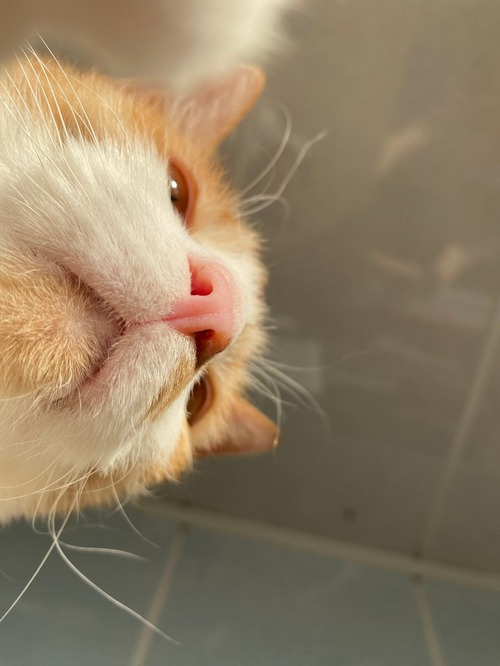

`Пусть это кот Елены Кантонистовой :)`